# Zadanie domowe

W przypadku obrazów w odcieniach szarości pojedynczy piksel z zakresu [0; 255] reprezentowany jest jako 8-bitowa liczba bez znaku.
Pewnym rozszerzeniem analizy sposobu reprezentacji obrazu może być następujący eksperyment.
Załóżmy, że z każdego z 8 bitów możemy stworzyć pojedynczy obraz binarny (ang. _bit-plane slicing_).
Dla obrazka _100zloty.jpg_ (https://raw.githubusercontent.com/vision-agh/poc_sw/master/02_Point/100zloty.jpg) stwórz 8 obrazów, z których każdy powinien zawierać jedną płaszczyznę bitową.
Podpowiedź $-$ warto sprawdzić, jak realizuje się bitowe operacje logiczne.
Zastosowanie takiej dekompozycji obrazu pozwala na analizę ,,ważności'' poszczególnych bitów.
Jest to użyteczne w kwantyzacji, ale także w kompresji.

W drugim etapie zadania proszę spróbować odtworzyć obraz oryginalny z mniejszej liczby obrazów binarnych.
Warto zacząć od dwóch najbardziej znaczących bitów, a później dodawać kolejne.
Należy utworzyć co najmniej trzy wersje zrekonstruowanych obrazów.
Podpowiedź $-$ rekonstrukcja obrazu to mnożenie przez odpowiednią potęgę liczby 2 (przesunięcie bitowe) oraz dodawanie.

In [189]:
import cv2
import os
import requests
import matplotlib.pyplot as plt

url = 'https://raw.githubusercontent.com/vision-agh/poc_sw/master/02_Point/'
fileName = '100zloty.jpg'
if not os.path.exists(fileName):
    r = requests.get(url + fileName, allow_redirects=True)
    open(fileName, 'wb').write(r.content)

In [190]:
image = cv2.imread(fileName)

def show_image( image ):
    plt.imshow(image)
    plt.xticks([]), plt.yticks([])
    plt.show()

def use_mask(image, mask = 0b00000000):
    divider = 1

    tmp = mask
    while tmp % 2 != 1 and tmp != 0:
        tmp %= 2
        divider *= 2

    return (image & mask) // divider * 2

def to_bin(integer):
    return format(integer, '08b')

def generate_layer(image, mask):
    masked_image = use_mask(image, mask)
    return masked_image

def draw_masked_image(image, mask):
    print("Used mask: ", to_bin(mask))
    masked_image = use_mask(image, mask)
    show_image(masked_image)
    return masked_image

# Wygląd poszczególnych warstw

layer 7.


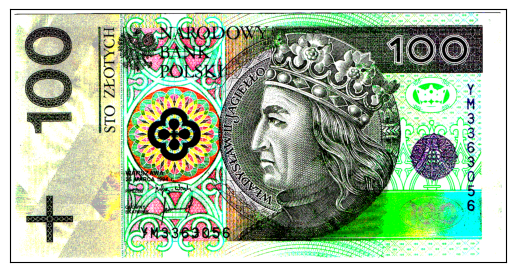

layer 6.


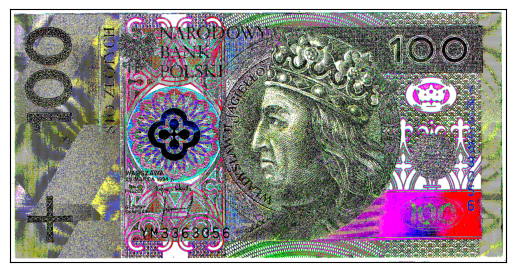

layer 5.


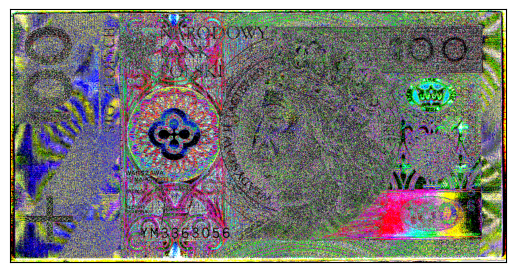

layer 4.


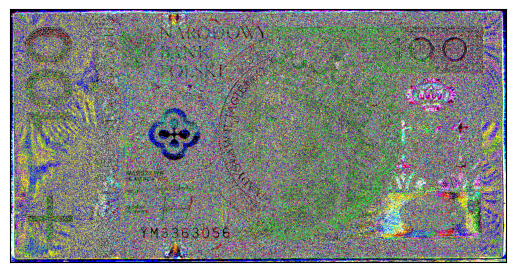

layer 3.


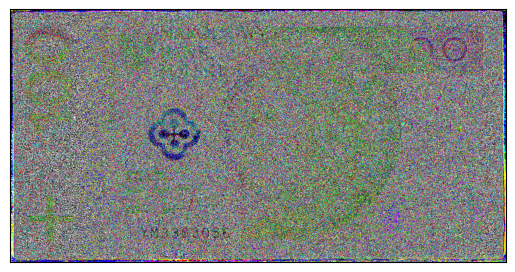

layer 2.


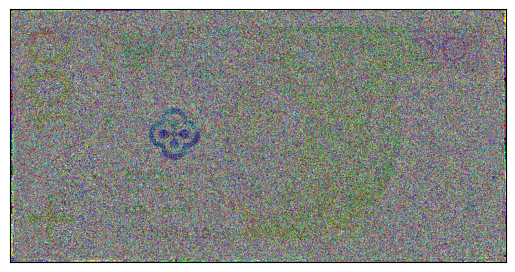

layer 1.


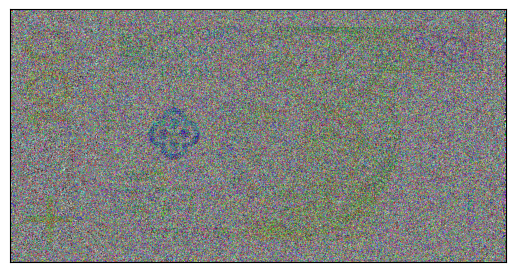

layer 0.


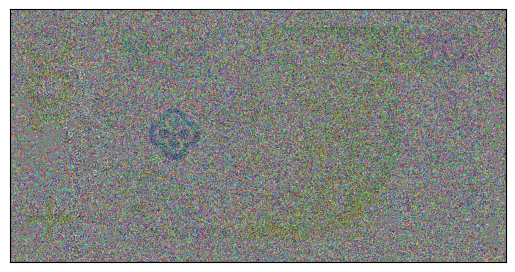

In [191]:
def split_to_layers(image):
    masks = [
        0b10000000,
        0b01000000,
        0b00100000,
        0b00010000,
        0b00001000,
        0b00000100,
        0b00000010,
        0b00000001
    ]

    layers = []

    for mask in masks:
        layers.append(generate_layer(image, mask) // mask)

    return layers

def show_all_layers(layers):
    for i in range(len(layers)):
        print(f'layer { len(layers) - i - 1}.')
        show_image(layers[i] * 255)

layers = split_to_layers(image)

show_all_layers(layers)

Least significant bit:  7


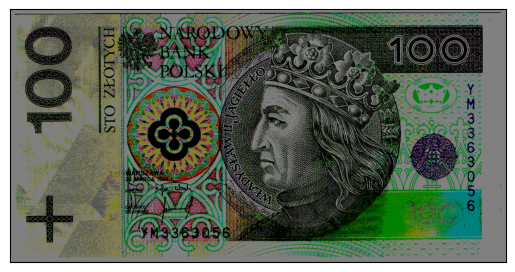

Least significant bit:  6


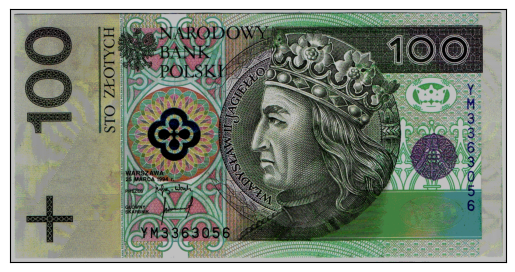

Least significant bit:  5


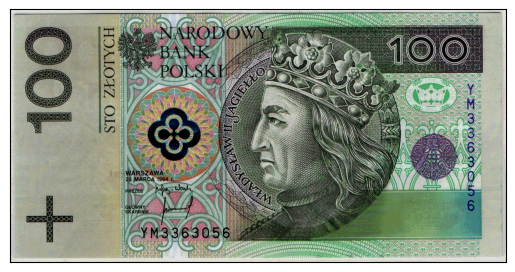

Least significant bit:  4


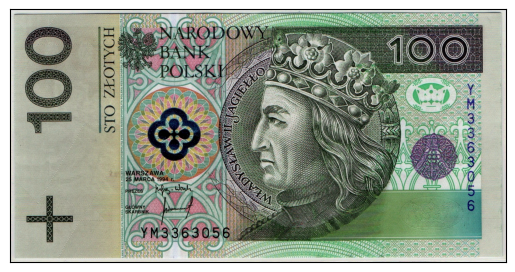

Least significant bit:  3


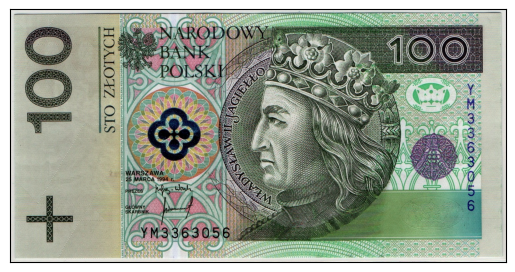

Least significant bit:  2


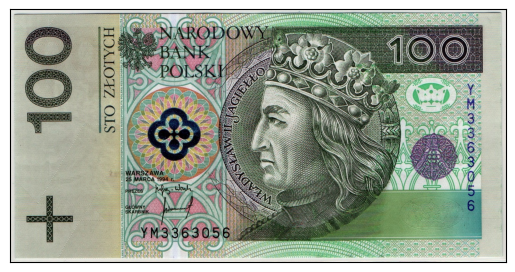

Least significant bit:  1


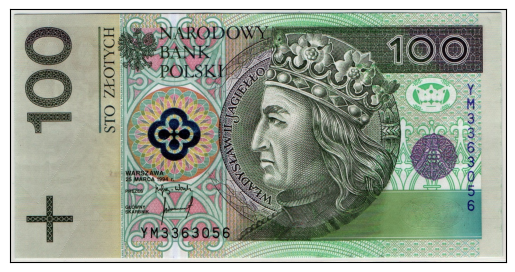

Least significant bit:  0


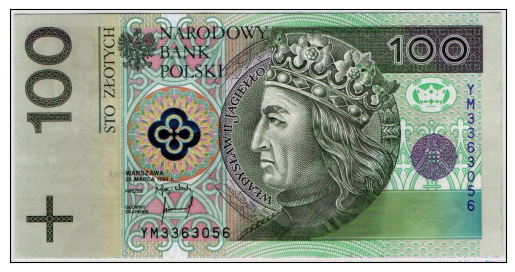

In [192]:
def reconstruct_from_layers(layers):
    current_image = layers[0] << 7
    print("Least significant bit: ", 7)
    show_image(current_image)
    length = 8

    for i in range(1, length):
        print("Least significant bit: ", length - i - 1)
        current_image = current_image + (layers[i] << (length - i - 1))
        show_image(current_image)
    
reconstruct_from_layers(layers)

Możemy zauważyć, że na pierwszy rzut oka mniej więcej od sumy 7,6 oraz 5 bitu, dodatkowe bity nie przynoszą nam aż tak bardzo widocznych zmian.

**Uwaga!** Najmniej znaczącym bitem jest bit o id. **0**, a najbardziej znaczącym jest bit o id. **7**

# Grayscale

W celu potwierdzenia powyższych wniosków, powtórzymy badania na grayscale

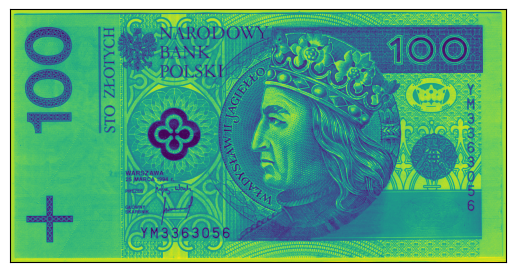

In [193]:
gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
show_image(gray_image)

layer 7.


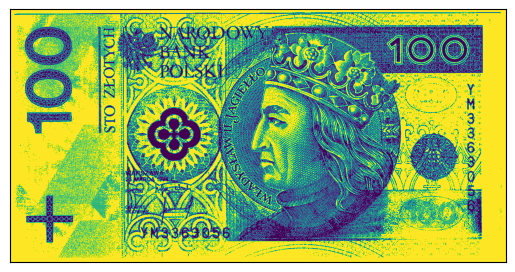

layer 6.


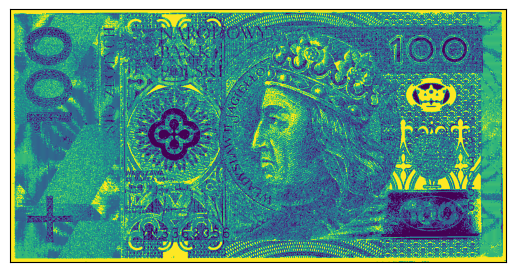

layer 5.


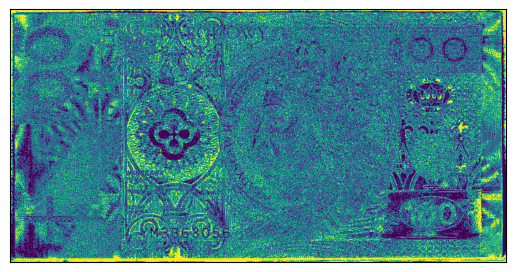

layer 4.


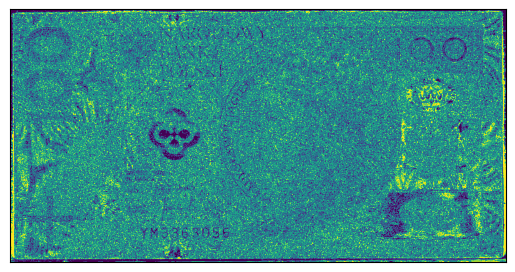

layer 3.


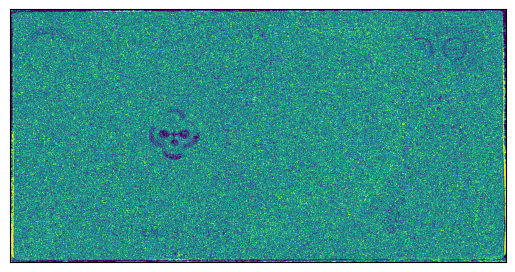

layer 2.


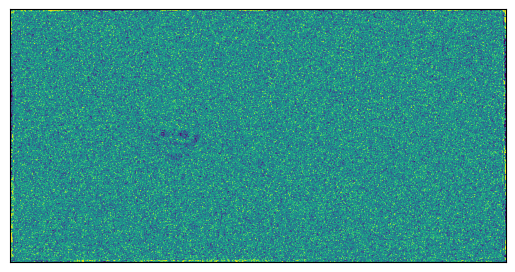

layer 1.


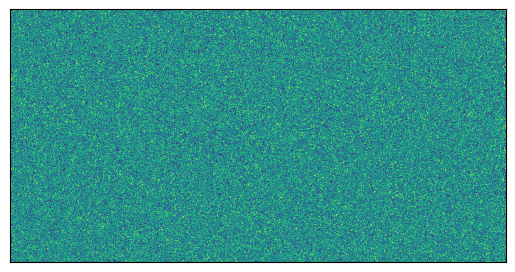

layer 0.


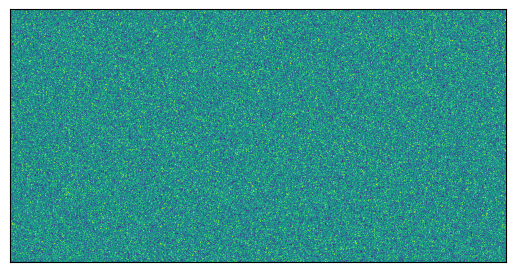

In [194]:
gray_layers = split_to_layers(gray_image)
show_all_layers(gray_layers)

Least significant bit:  7


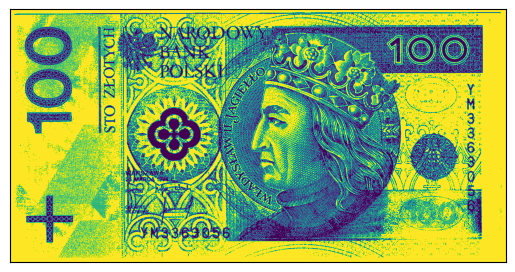

Least significant bit:  6


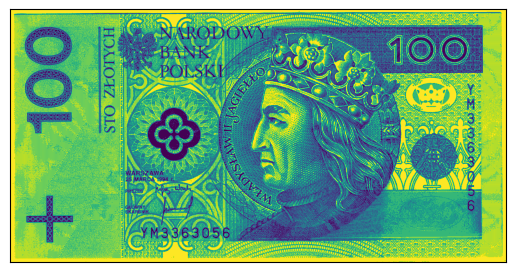

Least significant bit:  5


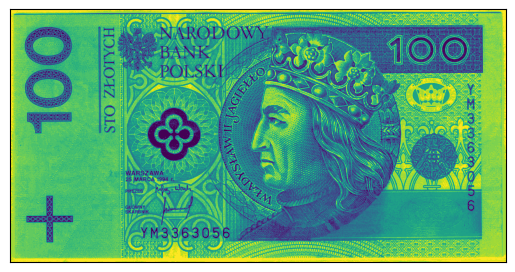

Least significant bit:  4


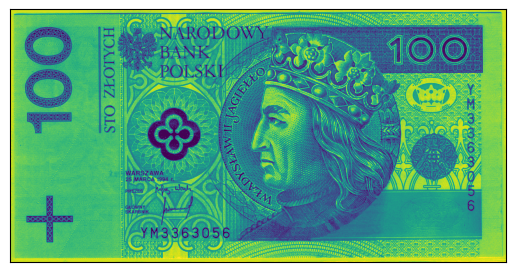

Least significant bit:  3


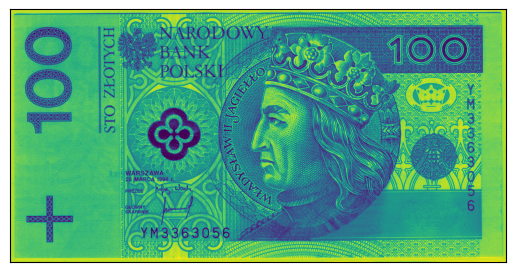

Least significant bit:  2


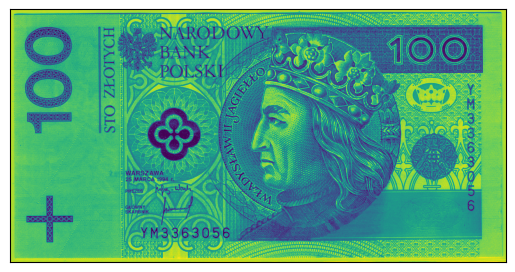

Least significant bit:  1


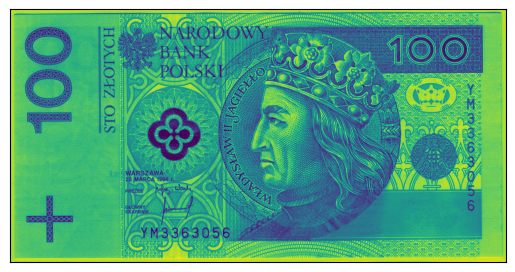

Least significant bit:  0


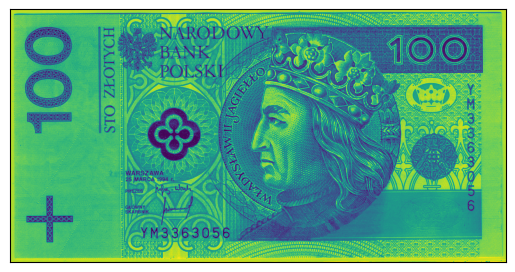

In [195]:
reconstruct_from_layers(gray_layers)

Powyższe rekonstrukcje potwierdzają wcześniej zapisaną tezę. Od rekonstrukcji z sumy 7,6 oraz 5 bitu różnice pomiędzy poszczególnymi zdjęciami są mało zauważalne.